## Import Libraries

In [1]:
import zipfile
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Import Data

In [2]:
# Extract the zip file
with zipfile.ZipFile('Flowers_data.zip', 'r') as zip_ref:
    zip_ref.extractall()


Random samples for carnation:


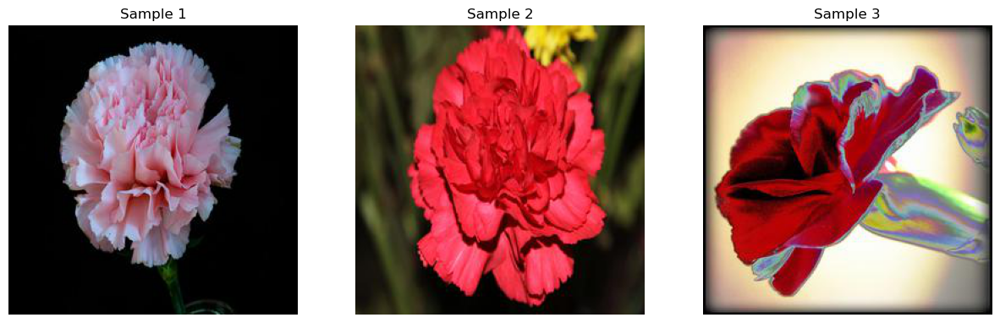

Random samples for iris:


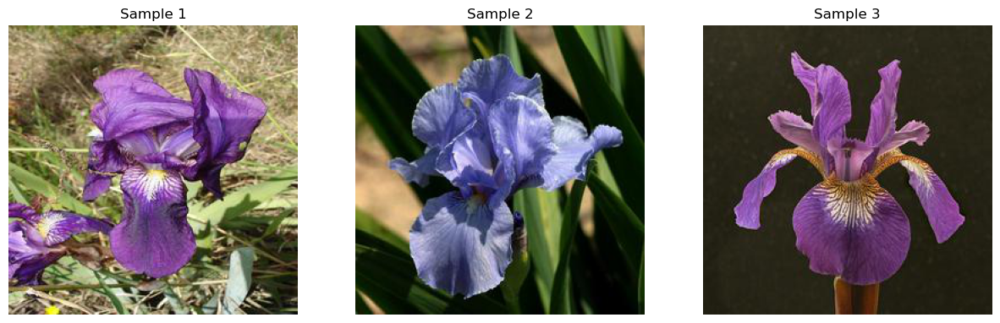

Random samples for bellflower:


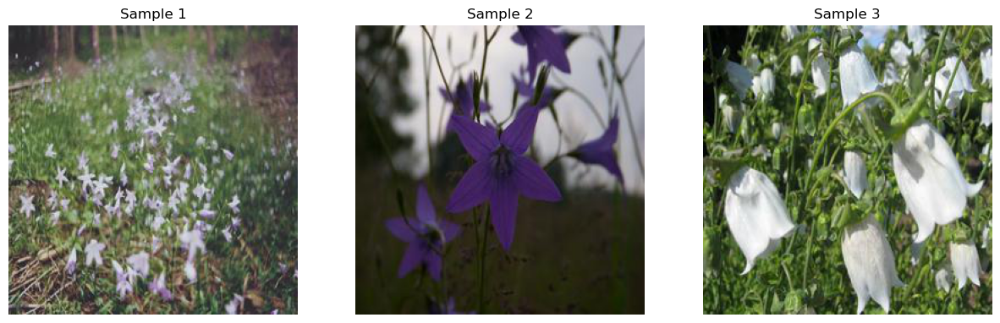

Random samples for california_poppy:


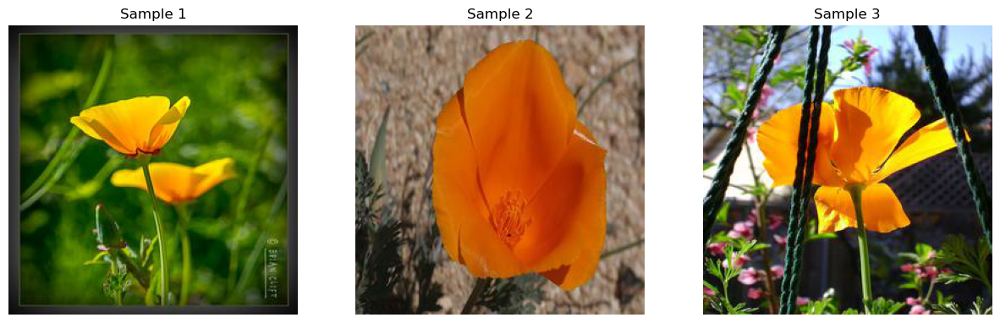

Random samples for rose:


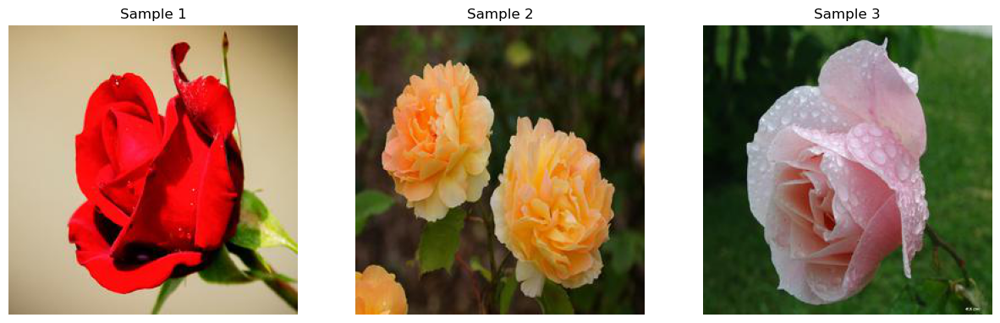

Random samples for astilbe:


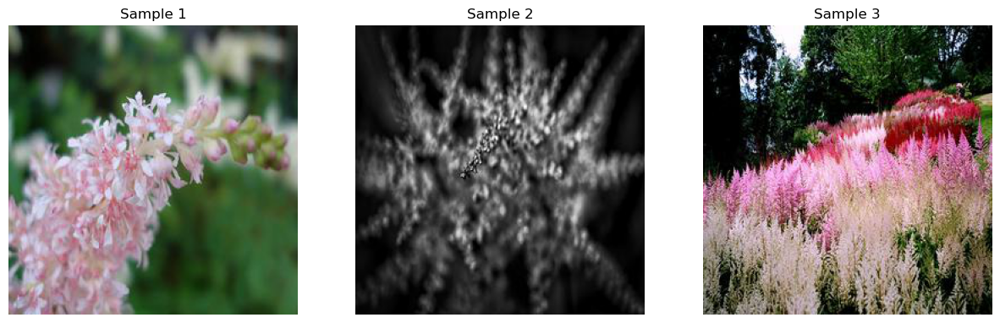

Random samples for tulip:


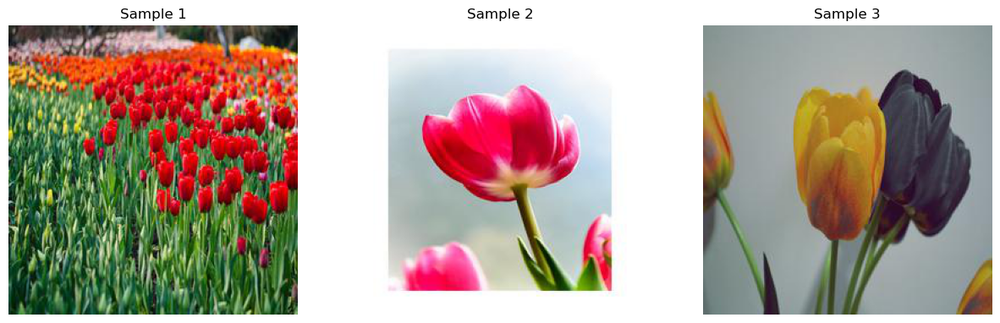

Random samples for calendula:


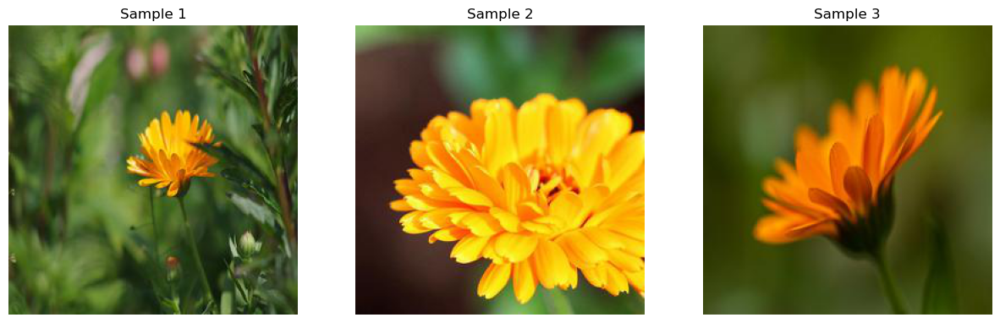

Random samples for dandelion:


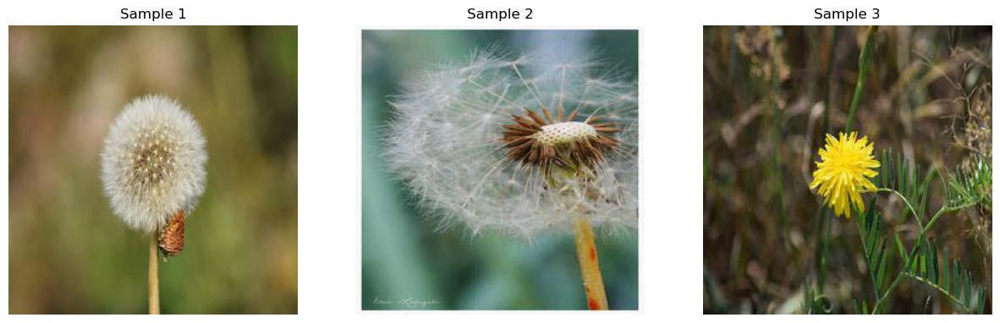

Random samples for coreopsis:


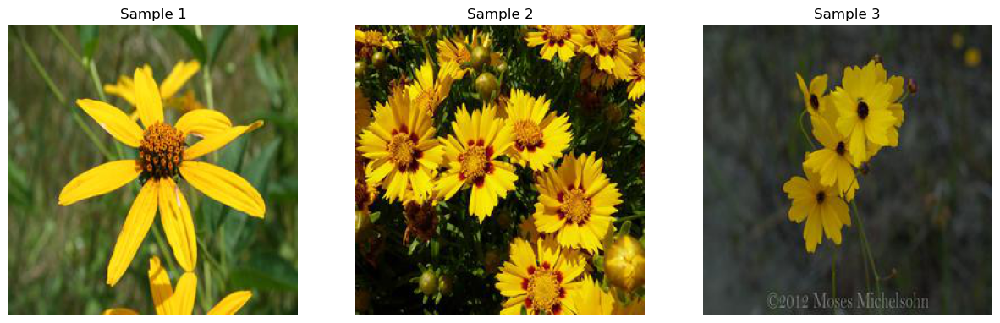

Random samples for black_eyed_susan:


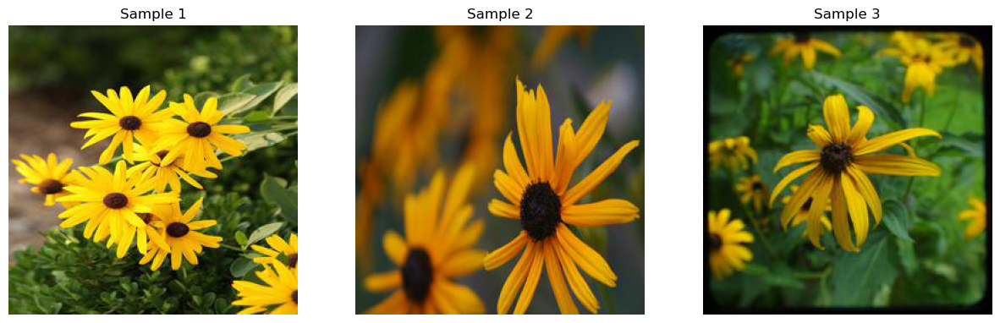

Random samples for water_lily:


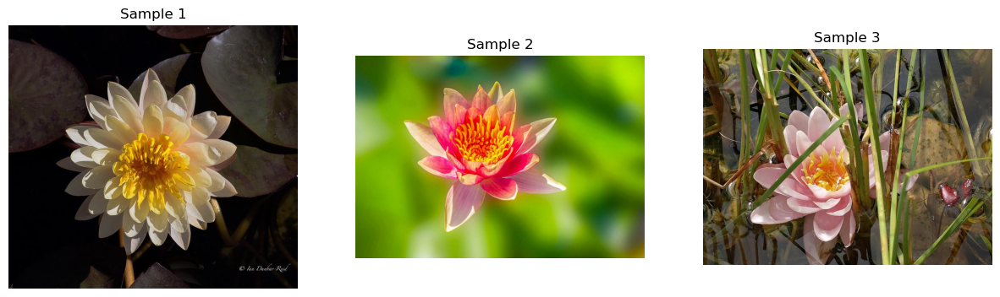

Random samples for sunflower:


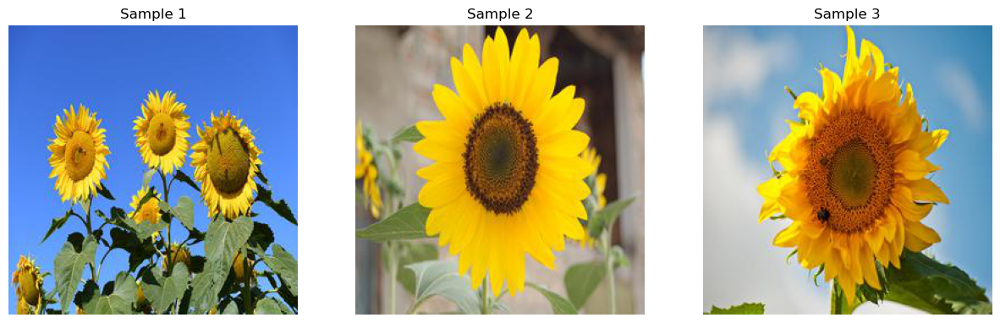

Random samples for common_daisy:


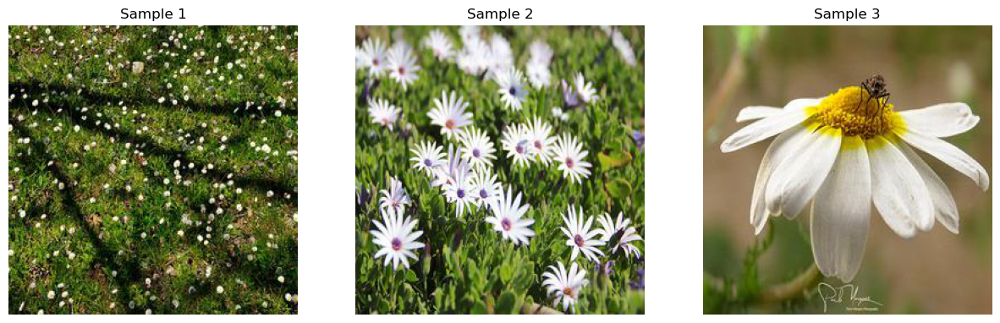

In [3]:
import random
from PIL import Image
import os
# Path to the directory containing the images
data_dir = 'Flowers_Data/Flowers_Data/train/'

# List of flower names
flower_names = [
    'carnation', 'iris', 'bellflower', 'california_poppy', 'rose', 'astilbe','tulip',
    'calendula', 'dandelion', 'coreopsis', 'black_eyed_susan', 'water_lily',
    'sunflower',  'common_daisy'
]

# Function to display random samples for each flower type
def display_random_samples(data_dir, flower_names, num_samples=3):
    for flower_name in flower_names:
        flower_path = os.path.join(data_dir, flower_name)
        flower_images = os.listdir(flower_path)
        random_samples = random.sample(flower_images, num_samples)

        print(f"Random samples for {flower_name}:")
        plt.figure(figsize=(15, 5))
        for i, image_name in enumerate(random_samples, 1):
            img_path = os.path.join(flower_path, image_name)
            img = Image.open(img_path)

            plt.subplot(1, num_samples, i)
            plt.imshow(img)
            plt.title(f"Sample {i}")
            plt.axis('off')

        plt.show()

# Display random samples for each flower type
display_random_samples(data_dir, flower_names, num_samples=3)

In [4]:
train_df = pd.read_csv('Flowers_Data/Flowers_Data/train.csv')
val_df = pd.read_csv('Flowers_Data/Flowers_Data/val.csv')

In [5]:
train_df.head()

,image:FILE,category
0,train/carnation/6838762136_f8254d6a1a_c.jpg,0
1,train/carnation/3540544866_823aee81af_c.jpg,0
2,train/carnation/50034862576_b0f55b7b3b_c.jpg,0
3,train/carnation/26770795691_f662e47143_c.jpg,0
4,train/carnation/18224456534_2f75191d85_c.jpg,0


## Process the data

In [6]:
train_images = []
val_images = []

In [7]:
def load_image(image_path):
    # Read image as uint8
    image = tf.io.read_file(image_path)

    # Decode JPEG image
    image = tf.image.decode_jpeg(image, channels=3)

    # Resize image to a fixed size
    image = tf.image.resize(image, (128, 128))

    # Normalize image values to [0, 1]
    image = tf.cast(image, tf.float32) / 255.0

    return image

def augment_image(image):
    # Random horizontal flip
    image = tf.image.random_flip_left_right(image)

    # Random crop
    image = tf.image.random_crop(image, [128, 128, 3])

    # Random brightness
    image = tf.image.random_brightness(image, max_delta=0.3)

    return image

In [8]:
# Create training dataset
# Corrected line: Use os.path.join to join directory and file paths
train_dataset = tf.data.Dataset.from_tensor_slices((
    train_df['image:FILE'].apply(lambda x: 'Flowers_Data/Flowers_Data/' + x), 
    train_df['category']
))

In [9]:
# Apply image loading and augmentation
train_dataset = train_dataset.map(lambda image, category: (augment_image(load_image(image)), category))

# Shuffle and batch the dataset
train_dataset = train_dataset.shuffle(buffer_size=10000).batch(32)

In [10]:
# Create validation dataset
val_dataset = tf.data.Dataset.from_tensor_slices((
    val_df['image:FILE'].apply(lambda x: 'Flowers_Data/Flowers_Data/' + x), 
    val_df['category']
))

# Apply image loading
val_dataset = val_dataset.map(lambda image, category: (load_image(image), category))

# Batch the dataset
val_dataset = val_dataset.batch(32)

In [11]:
from tensorflow.keras import layers, models
from sklearn.model_selection import ParameterGrid

In [12]:
# Define the model
def build_model():
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(14, activation='softmax') # 14 flower categories
    ])
    return model

In [13]:
param_grid = {
    'learning_rate': [0.001],
    'batch_size': [16, 32],
    'epochs': [10, 20]
}

grid = ParameterGrid(param_grid)

best_accuracy = 0
best_hyperparameters = {}

for params in grid:
    print(f"Training with hyperparameters: {params}")

    model = build_model()
    optimizer = tf.keras.optimizers.Adam(learning_rate=params['learning_rate'])
    model.compile(optimizer=optimizer,
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])

    history = model.fit(train_dataset, epochs=params['epochs'], batch_size=params['batch_size'], validation_data=val_dataset)

    _, accuracy = model.evaluate(val_dataset)

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_hyperparameters = params

print("Best Hyperparameters:", best_hyperparameters)


Training with hyperparameters: {'batch_size': 16, 'epochs': 10, 'learning_rate': 0.001}
Epoch 1/10
427/427 [==============================] - 75s 159ms/step - loss: 1.6497 - accuracy: 0.4268 - val_loss: 1.3524 - val_accuracy: 0.5306
Epoch 2/10
427/427 [==============================] - 76s 163ms/step - loss: 1.1700 - accuracy: 0.5906 - val_loss: 1.1037 - val_accuracy: 0.5816
Epoch 3/10
427/427 [==============================] - 77s 165ms/step - loss: 0.9286 - accuracy: 0.6775 - val_loss: 1.0229 - val_accuracy: 0.5816
Epoch 4/10
427/427 [==============================] - 112s 248ms/step - loss: 0.7517 - accuracy: 0.7415 - val_loss: 0.8560 - val_accuracy: 0.6837
Epoch 5/10
427/427 [==============================] - 86s 185ms/step - loss: 0.6075 - accuracy: 0.7928 - val_loss: 0.7329 - val_accuracy: 0.7449
Epoch 6/10
427/427 [==============================] - 86s 185ms/step - loss: 0.4687 - accuracy: 0.8401 - val_loss: 0.8639 - val_accuracy: 0.6837
Epoch 7/10
427/427 [=====================

Epoch 1/20
427/427 [==============================] - 99s 215ms/step - loss: 1.5922 - accuracy: 0.4469 - val_loss: 1.3111 - val_accuracy: 0.4898
Epoch 2/20
427/427 [==============================] - 98s 212ms/step - loss: 1.0931 - accuracy: 0.6231 - val_loss: 0.9498 - val_accuracy: 0.6020
Epoch 3/20
427/427 [==============================] - 91s 197ms/step - loss: 0.8642 - accuracy: 0.7049 - val_loss: 0.9590 - val_accuracy: 0.6429
Epoch 4/20
427/427 [==============================] - 95s 207ms/step - loss: 0.6965 - accuracy: 0.7626 - val_loss: 0.7924 - val_accuracy: 0.6939
Epoch 5/20
427/427 [==============================] - 95s 207ms/step - loss: 0.5626 - accuracy: 0.8050 - val_loss: 0.8603 - val_accuracy: 0.6939
Epoch 6/20
427/427 [==============================] - 98s 212ms/step - loss: 0.4348 - accuracy: 0.8518 - val_loss: 0.7721 - val_accuracy: 0.6939
Epoch 7/20
427/427 [==============================] - 95s 207ms/step - loss: 0.3441 - accuracy: 0.8826 - val_loss: 0.9654 - val_ac

Epoch 1/10
427/427 [==============================] - 92s 199ms/step - loss: 1.6390 - accuracy: 0.4321 - val_loss: 1.3375 - val_accuracy: 0.5000
Epoch 2/10
427/427 [==============================] - 90s 195ms/step - loss: 1.1292 - accuracy: 0.6064 - val_loss: 1.1490 - val_accuracy: 0.5714
Epoch 3/10
427/427 [==============================] - 92s 200ms/step - loss: 0.8985 - accuracy: 0.6875 - val_loss: 0.8101 - val_accuracy: 0.7347
Epoch 4/10
427/427 [==============================] - 88s 191ms/step - loss: 0.7302 - accuracy: 0.7476 - val_loss: 0.7904 - val_accuracy: 0.6735
Epoch 5/10
427/427 [==============================] - 90s 194ms/step - loss: 0.5798 - accuracy: 0.8037 - val_loss: 0.8103 - val_accuracy: 0.7041
Epoch 6/10
427/427 [==============================] - 91s 198ms/step - loss: 0.4602 - accuracy: 0.8427 - val_loss: 0.7176 - val_accuracy: 0.7959
Epoch 7/10
427/427 [==============================] - 89s 193ms/step - loss: 0.3672 - accuracy: 0.8766 - val_loss: 0.8409 - val_ac

Epoch 1/20
427/427 [==============================] - 79s 170ms/step - loss: 1.6455 - accuracy: 0.4259 - val_loss: 1.2503 - val_accuracy: 0.5306
Epoch 2/20
427/427 [==============================] - 81s 175ms/step - loss: 1.1517 - accuracy: 0.6016 - val_loss: 0.9577 - val_accuracy: 0.6531
Epoch 3/20
427/427 [==============================] - 83s 179ms/step - loss: 0.8974 - accuracy: 0.6899 - val_loss: 0.9017 - val_accuracy: 0.6429
Epoch 4/20
427/427 [==============================] - 83s 178ms/step - loss: 0.7284 - accuracy: 0.7540 - val_loss: 0.8441 - val_accuracy: 0.6837
Epoch 5/20
427/427 [==============================] - 82s 176ms/step - loss: 0.5779 - accuracy: 0.8044 - val_loss: 0.8342 - val_accuracy: 0.7245
Epoch 6/20
427/427 [==============================] - 90s 195ms/step - loss: 0.4539 - accuracy: 0.8428 - val_loss: 0.8155 - val_accuracy: 0.7449
Epoch 7/20
427/427 [==============================] - 89s 192ms/step - loss: 0.3580 - accuracy: 0.8801 - val_loss: 0.9498 - val_ac

In [14]:
final_model = build_model()
final_optimizer = tf.keras.optimizers.Adam(learning_rate=best_hyperparameters['learning_rate'])
final_model.compile(optimizer=final_optimizer,
                    loss='sparse_categorical_crossentropy',  # Use sparse categorical crossentropy for integer labels
                    metrics=['accuracy'])

final_history = final_model.fit(train_dataset, epochs=best_hyperparameters['epochs'], batch_size=best_hyperparameters['batch_size'], validation_data=val_dataset)

Epoch 1/10
427/427 [==============================] - 81s 173ms/step - loss: 1.6772 - accuracy: 0.4084 - val_loss: 1.2699 - val_accuracy: 0.4796
Epoch 2/10
427/427 [==============================] - 87s 188ms/step - loss: 1.2034 - accuracy: 0.5784 - val_loss: 1.0512 - val_accuracy: 0.6224
Epoch 3/10
427/427 [==============================] - 89s 192ms/step - loss: 0.9526 - accuracy: 0.6705 - val_loss: 0.8862 - val_accuracy: 0.6939
Epoch 4/10
427/427 [==============================] - 85s 184ms/step - loss: 0.7553 - accuracy: 0.7420 - val_loss: 0.8600 - val_accuracy: 0.7041
Epoch 5/10
427/427 [==============================] - 86s 187ms/step - loss: 0.6153 - accuracy: 0.7918 - val_loss: 0.9626 - val_accuracy: 0.6429
Epoch 6/10
427/427 [==============================] - 90s 196ms/step - loss: 0.4830 - accuracy: 0.8376 - val_loss: 0.9051 - val_accuracy: 0.7041
Epoch 7/10
427/427 [==============================] - 84s 182ms/step - loss: 0.3810 - accuracy: 0.8705 - val_loss: 0.8567 - val_ac

### Evaluate on Validation dataset

In [15]:
# Evaluate the final model on the validation dataset
validation_loss, validation_accuracy = final_model.evaluate(val_dataset)
print(f'Validation Accuracy: {validation_accuracy}')

4/4 [==============================] - 0s 40ms/step - loss: 0.8118 - accuracy: 0.7449
Validation Accuracy: 0.7448979616165161


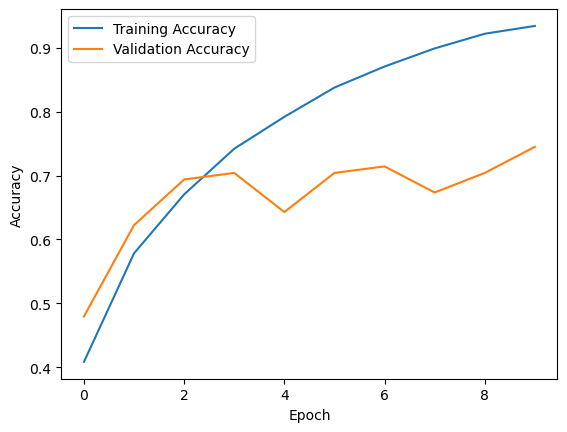

In [16]:
# Plot training history of the final model
import matplotlib.pyplot as plt

plt.plot(final_history.history['accuracy'], label='Training Accuracy')
plt.plot(final_history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [17]:
true_labels = []

for batch in val_dataset:
    true_labels.extend(batch[1].numpy())  # Assuming labels are in the second element of each batch

true_labels = tf.convert_to_tensor(true_labels)

In [18]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Get predicted labels
predicted_labels = final_model.predict(val_dataset)
predicted_labels = np.argmax(predicted_labels, axis=1)

# Compute metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')

# Print or use the computed metrics as needed
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1-score: {f1}')

4/4 [==============================] - 0s 33ms/step
Accuracy: 0.7448979591836735
Precision: 0.7774273345701918
Recall: 0.7448979591836735
F1-score: 0.7243270851464129


In [19]:
from sklearn.metrics import classification_report

# Assuming true_labels and predicted_labels are NumPy arrays
print("\nClassification Report:")
print(classification_report(true_labels, predicted_labels))


Classification Report:
              precision    recall  f1-score   support

           0       0.33      0.43      0.38         7
           1       0.70      1.00      0.82         7
           2       0.75      0.86      0.80         7
           3       0.64      1.00      0.78         7
           4       0.50      0.29      0.36         7
           5       1.00      0.71      0.83         7
           6       0.88      1.00      0.93         7
           7       1.00      0.14      0.25         7
           8       1.00      0.86      0.92         7
           9       0.71      0.71      0.71         7
          10       1.00      0.86      0.92         7
          11       0.80      0.57      0.67         7
          12       0.88      1.00      0.93         7
          13       0.70      1.00      0.82         7

    accuracy                           0.74        98
   macro avg       0.78      0.74      0.72        98
weighted avg       0.78      0.74      0.72        98



In [20]:
classes = sorted(set(true_labels.numpy()))

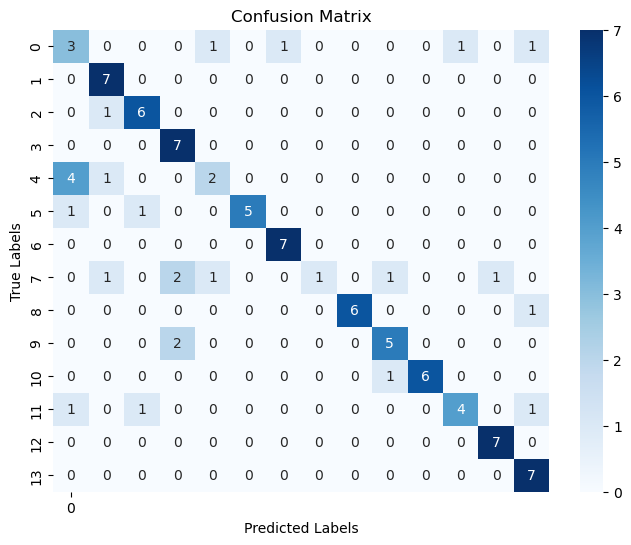

In [21]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming true_labels and predicted_labels are NumPy arrays
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=14, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [22]:
from sklearn.metrics import cohen_kappa_score
# Kappa Coefficient
kappa = cohen_kappa_score(true_labels, predicted_labels)
print("\nKappa Coefficient:", kappa)


Kappa Coefficient: 0.7252747252747253


In [23]:
# Informedness
tp = confusion_matrix(true_labels, predicted_labels)[1, 1]
fn = confusion_matrix(true_labels, predicted_labels)[1, 0]
fp = confusion_matrix(true_labels, predicted_labels)[0, 1]
tn = confusion_matrix(true_labels, predicted_labels)[0, 0]
informedness = (tp / (tp + fn)) + (tn / (tn + fp)) - 1
print("Informedness:", informedness)

Informedness: 1.0


In [24]:
from sklearn.metrics import mean_squared_error
# Mean Squared Error
mse = mean_squared_error(true_labels, predicted_labels)
print("\nMean Squared Error:", mse)


Mean Squared Error: 8.775510204081632


In [25]:
num_classes = 14
num_epochs = 10
batch_size = 32

img_height = 299
img_width = 299

In [26]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255)

In [27]:
train_generator = train_datagen.flow_from_directory(
    'Flowers_Data/Flowers_Data/train',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    'Flowers_Data/Flowers_Data/val',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

Found 13642 images belonging to 14 classes.
Found 98 images belonging to 14 classes.


### InceptionV3 Model

In [28]:
from keras.applications.inception_v3 import InceptionV3

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

In [29]:
for layer in base_model.layers:
    layer.trainable = False

In [30]:
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model

x = base_model.output
x = GlobalAveragePooling2D()(x)

In [31]:
from tensorflow.keras.layers import Dense

x = Dense(256, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

In [32]:
model = Model(inputs=base_model.input, outputs=predictions)

In [33]:
from tensorflow.keras.optimizers import Adam

model.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [34]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d_15 (Conv2D)          (None, 149, 149, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 149, 149, 32)         96        ['conv2d_15[0][0]']           
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 149, 149, 32)         0         ['batch_normalization[0][0

In [35]:
history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=val_generator
)

Epoch 1/10
427/427 [==============================] - 693s 2s/step - loss: 0.6731 - accuracy: 0.7870 - val_loss: 0.3343 - val_accuracy: 0.8980
Epoch 2/10
427/427 [==============================] - 713s 2s/step - loss: 0.3958 - accuracy: 0.8694 - val_loss: 0.2588 - val_accuracy: 0.9388
Epoch 3/10
427/427 [==============================] - 704s 2s/step - loss: 0.3181 - accuracy: 0.8949 - val_loss: 0.3304 - val_accuracy: 0.8980
Epoch 4/10
427/427 [==============================] - 704s 2s/step - loss: 0.3004 - accuracy: 0.8976 - val_loss: 0.3031 - val_accuracy: 0.9388
Epoch 5/10
427/427 [==============================] - 715s 2s/step - loss: 0.2689 - accuracy: 0.9098 - val_loss: 0.2438 - val_accuracy: 0.8980
Epoch 6/10
427/427 [==============================] - 697s 2s/step - loss: 0.2464 - accuracy: 0.9180 - val_loss: 0.2939 - val_accuracy: 0.8980
Epoch 7/10
427/427 [==============================] - 720s 2s/step - loss: 0.2314 - accuracy: 0.9208 - val_loss: 0.2326 - val_accuracy: 0.9388

In [36]:
evaluation = model.evaluate(val_generator)
print("Validation Accuracy: {:.2f}%".format(evaluation[1] * 100))
print("Validation Loss: {:.4f}".format(evaluation[0]))

4/4 [==============================] - 4s 959ms/step - loss: 0.2011 - accuracy: 0.9592
Validation Accuracy: 95.92%
Validation Loss: 0.2011


### Xception Model

In [37]:
from keras.applications.xception import Xception

base_model = Xception(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))

In [38]:
for layer in base_model.layers:
    layer.trainable = False

In [39]:
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.models import Model

x = base_model.output
x = GlobalAveragePooling2D()(x)

In [40]:
x = Dense(256, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

In [41]:
model = Model(inputs=base_model.input, outputs=predictions)

In [42]:
model.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [43]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 149, 149, 32)         864       ['input_2[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 149, 149, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  (None, 149, 149, 32)         0         ['block1_conv1_bn[0][0]'

In [44]:
history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=val_generator
)

Epoch 1/10
427/427 [==============================] - 2523s 6s/step - loss: 0.5801 - accuracy: 0.8169 - val_loss: 0.2884 - val_accuracy: 0.9286
Epoch 2/10
427/427 [==============================] - 1135s 3s/step - loss: 0.3401 - accuracy: 0.8892 - val_loss: 0.2619 - val_accuracy: 0.9388
Epoch 3/10
427/427 [==============================] - 1072s 3s/step - loss: 0.2775 - accuracy: 0.9095 - val_loss: 0.2377 - val_accuracy: 0.9286
Epoch 4/10
427/427 [==============================] - 916s 2s/step - loss: 0.2486 - accuracy: 0.9156 - val_loss: 0.2109 - val_accuracy: 0.9286
Epoch 5/10
427/427 [==============================] - 927s 2s/step - loss: 0.2155 - accuracy: 0.9276 - val_loss: 0.2374 - val_accuracy: 0.9184
Epoch 6/10
427/427 [==============================] - 949s 2s/step - loss: 0.2021 - accuracy: 0.9326 - val_loss: 0.2584 - val_accuracy: 0.9286
Epoch 7/10
427/427 [==============================] - 926s 2s/step - loss: 0.1793 - accuracy: 0.9400 - val_loss: 0.2384 - val_accuracy: 0.9

In [45]:
evaluation = model.evaluate(val_generator)
print("Validation Accuracy: {:.2f}%".format(evaluation[1] * 100))
print("Validation Loss: {:.4f}".format(evaluation[0]))

4/4 [==============================] - 7s 1s/step - loss: 0.2196 - accuracy: 0.9592
Validation Accuracy: 95.92%
Validation Loss: 0.2196
